### **Convolutional Neural Network**
#### Image Upscaling using Fast Super Resolution Convolutional Neural Networks (FSRCNN)

#### **Team Members:**
1. Huzaifa Ejaz (F2020-690)
2. Ibraheem Omer (F2020-150)

#### **References:**
- [Image Super-Resolution - Paperspace](https://blog.paperspace.com/image-super-resolution/)
- [Image Super-Resolution using Deep Learning and PyTorch - Debugger Cafe](https://debuggercafe.com/image-super-resolution-using-deep-learning-and-pytorch/)
- [Super-Resolution using Sparse Representation - CSE YorkU](http://www.cse.yorku.ca/~mbrown/pdf/eccv10_SR.pdf)

## Extracting Files from a Zip Archive for Project Usage

This code snippet demonstrates the process of extracting files from a zip archive using Python's `zipfile` module within a Jupyter notebook. Here's a breakdown of what the code does:

### Libraries Imported:
- `os`: Operating system functionalities.
- `math`: Basic mathematical operations.
- `numpy`: Numerical computing library.
- `tensorflow`: Machine learning framework.
- `zipfile`: Module for working with zip archives.
- `matplotlib`: Plotting library.
- `PIL`: Python Imaging Library for image processing.
- `IPython.display`: Display-related utilities for IPython.

### File Extraction Process:
1. **File Paths:** Specifies the path of the zip file (`zip_file_path`) and the directory where the contents will be extracted (`extracted_dir`).
2. **Directory Creation:** Creates the destination directory if it doesn't exist already.
3. **Extracting Zip Contents:** Utilizes the `zipfile` module to extract all contents from the specified zip file into the destination directory.
4. **Setting Root Path:** Assigns the extracted directory path (`extracted_dir`) as the root directory for further operations.

### Usage:
- Adjust the `extracted_dir` variable to the absolute path where you want the contents to be extracted.
- Upon execution, this code will extract the contents of the specified zip file into the designated directory, allowing subsequent operations to use `root_path` as the base directory for accessing the extracted files.

In [6]:
import os
import math
import numpy as np
import tensorflow as tf
import zipfile


from matplotlib import pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL

from IPython.display import display

zip_file_path = 'archive.zip'

# Destination directory to extract the contents 
# CHANGE THE EXTRACTED DIR TO YOUR PROJECTS ABSOLUTE PATH 
extracted_dir = '/Users/admin/Desktop/CCclient/'

# Create the destination directory if it doesn't exist
os.makedirs(extracted_dir, exist_ok=True)

# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

# Now, you can use the `extracted_dir` as the root_path
root_path = extracted_dir

## Data Preparation for Training and Validation

This code snippet involves preparing training and validation datasets using TensorFlow for a machine learning task. Let's delve into the details:

### Image Processing Parameters:
- `target_size`: Specifies the intended size for images (300 pixels), which will later be downscaled for processing.
- `upscale_factor`: Defines the scaling factor used for upscaling images later.
- `input_size`: Determines the size after downscaling the images for model input.

### Dataset Creation:
- **Training and Validation Split:** Utilizes `image_dataset_from_directory` from TensorFlow's Keras preprocessing module.
- **Directories:** Utilizes `root_path` as the base directory for sourcing images.
- **Image Size:** Sets images' size to 300x300 pixels for both training and validation datasets by default.
- **Validation Split:** Specifies a 20% split for validation data (`validation_split=0.2`).
- **Seed for Randomness:** Uses a seed value (42) for random data splitting, ensuring reproducibility.

### Usage:
- This code sets up training (`train_data_raw`) and validation (`validate_data_raw`) datasets for subsequent machine learning tasks.
- Images will initially be processed at a higher resolution (300x300) for better quality and then downscaled for model input.

In [7]:
target_size = 300 # We will reduce the image's size by half so we can upscale it later on
upscale_factor = 3
input_size = target_size // upscale_factor

# Creates the Trainig and Validation datasets and sets image sizes to 256x256 by default
train_data_raw = tf.keras.preprocessing.image_dataset_from_directory(root_path, label_mode=None, image_size=(target_size, target_size),validation_split=0.2, subset="training",   seed=42)
validate_data_raw = tf.keras.preprocessing.image_dataset_from_directory(root_path, label_mode=None, image_size=(target_size, target_size),validation_split=0.2, subset="validation", seed=42)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.


## Image Pixel Normalization

This code snippet defines a function and applies it to normalize the pixel values of the training and validation datasets within the range of 0 to 1.

### Normalization Function:
- **`scale` Function:** Defines a function that takes an image (`img`) as input and returns the image with its pixel values scaled down between 0 and 1 by dividing each pixel value by 255.0.

### Dataset Normalization:
- **Mapping Function:** Uses the `map` function from TensorFlow to apply the `scale` function to every image in the `train_data_raw` and `validate_data_raw` datasets.
- **Normalization Purpose:** Normalizing pixel values between 0 and 1 is a common practice in machine learning to ensure consistent and stable model training.

### Usage:
- The `scale` function is mapped across the entire training and validation datasets (`train_data_raw` and `validate_data_raw`) to normalize the pixel values of images before feeding them into the machine learning model.

In [8]:
# Scales the images so that each pixel value ranges from 0 to 1
def scale(img):
    return (img)/255.0

train_data = train_data_raw.map(scale)
validate_data = validate_data_raw.map(scale)

## Handling Test Image Paths

This code snippet deals with generating a sorted list containing the file paths of all images within the testing subset of a dataset.

### Paths and Directories:
- `dataset_path`: Points to the root directory where the 'images' folder containing the dataset is located.
- `test_path`: Represents the directory path specifically dedicated to the testing subset within the 'images' folder.

### Image Path Collection:
- **Empty List Initialization:** Initializes an empty list `test_imgs` to store the file paths of test images.
- **Iterating Through Files:** Loops through all files in the `test_path` directory.
- **File Format Check:** Filters files to include only those ending with ".jpg".
- **Building File Paths:** Appends the absolute paths of the filtered ".jpg" files in the `test_path` directory to the `test_imgs` list.

### Sorting Paths:
- **Sorting:** Sorts the collected image paths within `test_imgs` in ascending order using `sorted()`.

### Usage:
- This code snippet collects and sorts the file paths of all ".jpg" images within the designated testing subset directory (`test_path`), storing them in the `test_imgs` list for further processing or evaluation purposes.

In [9]:
dataset_path = os.path.join(root_path, "images")
test_path = os.path.join(dataset_path, "test")

# Creates a list with the paths of all images in the testing subset and then sorts it

test_imgs = []

for img in os.listdir(test_path):
  if img.endswith(".jpg"):
    test_imgs.append(os.path.join(test_path, img))

test_imgs = sorted(test_imgs)

## Image Processing Functions and Dataset Preparation

This code snippet defines functions to process input and target images, subsequently preparing the training and validation datasets for a machine learning task.

### Image Processing Functions:
- **`process_input` Function:** Resizes the input image to a specified `target_size` using the 'area' method via TensorFlow's `tf.image.resize` function.
- **`process_target` Function:** Converts the target image format from RGB to YUV scale, specifically extracting the luminance (Y) channel.

### Dataset Preparation:
- **Processing Training Data:**
    - `train_data_yuv`: Maps the `process_target` function to convert the training data to YUV scale.
    - `train_data_scaled`: Maps a lambda function to pair each processed image from `train_data_yuv` with its downscaled counterpart, using `process_input`.
    - `train_ds`: Prepares the final training dataset by prefetching and setting a buffer size of 32 for optimization.

- **Processing Validation Data:**
    - `validate_data_yuv`: Converts the validation data to YUV scale similarly to the training data.
    - `validate_data_scaled`: Pairs each processed image from `validate_data_yuv` with its downscaled counterpart using `process_input`.
    - `valid_ds`: Prepares the final validation dataset by prefetching and setting a buffer size of 32 for optimization.

### Usage:
- The code processes the training and validation datasets, converting images to the YUV color space (for targets) and resizing inputs using the specified parameters. This prepares the datasets in a format suitable for training a machine learning model.

In [10]:

def process_input(img, target_size, upscale_factor):
    return tf.image.resize(img, [target_size, target_size], method="area")


def process_target(img):
    img = tf.image.rgb_to_yuv(img) # Change the image format to yuv scale, 
    return tf.split(img, 3, axis=3)[0]


train_data_yuv = train_data.map(process_target)
train_data_scaled = train_data_yuv.map(lambda img: (process_input(img, input_size, upscale_factor), img))

train_ds = train_data_scaled.prefetch(buffer_size=32) #

validate_data_yuv = validate_data.map(process_target)
validate_data_scaled = validate_data_yuv.map(lambda img: (process_input(img, input_size, upscale_factor), img))

valid_ds = validate_data_scaled.prefetch(buffer_size=32) #


## Visualizing Images from the Training Dataset

This code segment is designed to visualize images from the prepared training dataset using Matplotlib in a Jupyter notebook.

### Visualization Process:
1. **Dataset Extraction:**
   - Creates a list `l` containing elements from the `train_ds` dataset using `list(train_ds)`.

2. **Target Image Display:**
   - Converts the first target image element from the first dataset element (`l[0][1][0]`) into a PIL image using `tf.keras.preprocessing.image.array_to_img`.
   - Sets the size of the figure using the dimensions of the target image.
   - Displays the target image using `plt.imshow`.
   - Prints the size of the target image.

3. **Input Image Display:**
   - Converts the first input image element from the first dataset element (`l[0][0][0]`) into a PIL image using `tf.keras.preprocessing.image.array_to_img`.
   - Sets the size of the figure using the dimensions of the input image.
   - Displays the input image using `plt.imshow`.
   - Prints the size of the input image.

### Usage:
- The section attempts to visualize a pair of input and target images from the training dataset.

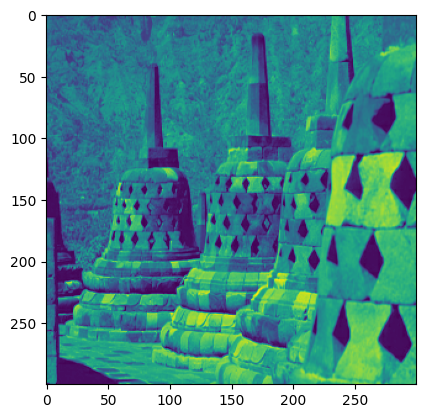

<Figure size 30000x30000 with 0 Axes>

(300, 300) 



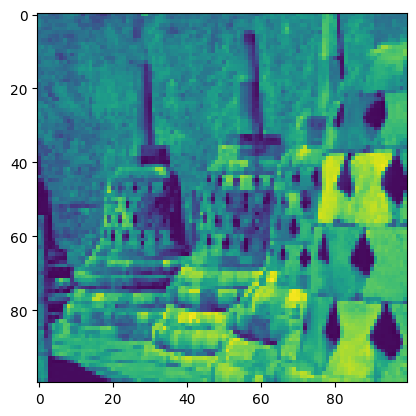

<Figure size 10000x10000 with 0 Axes>

(100, 100)


In [11]:
l = list(train_ds)

img1 = tf.keras.preprocessing.image.array_to_img(l[0][1][0])
plt.imshow(img1)
plt.figure(figsize=(img1.size[0], img1.size[1]))
plt.show()
print(img1.size,"\n")

img2 = tf.keras.preprocessing.image.array_to_img(l[0][0][0])
plt.imshow(img2)
plt.figure(figsize=(img2.size[0], img2.size[1]))
plt.show()
print(img2.size)

## Neural Network Model Definition and Compilation

This code segment defines a neural network model using TensorFlow's Keras API for a task involving image upscaling.

### Model Configuration:
- **Loss Function:** Uses Mean Squared Error (`keras.losses.MeanSquaredError()`) as the loss function for training the neural network.
- **Optimizer:** Utilizes the Adam optimizer (`keras.optimizers.Adam`) with a learning rate of 0.001.
- **Training Epochs:** Specifies the number of epochs for training the model (100 epochs).

### Network Architecture:
- **Convolutional Layers:**
  - Constructs a neural network with a series of convolutional layers:
    - Four convolutional layers are applied successively, gradually reducing the output dimensions.
    - The convolutional layers use tanh activation, Orthogonal kernel initialization, and "same" padding.
- **Upscaling Operation:**
  - Utilizes `tf.nn.depth_to_space` to perform the depth-to-space operation for upscaling. This operation reshapes the network's output to increase image resolution based on the specified `upscale_factor`.

### Usage:
- The neural network architecture presented in this section involves a series of convolutional layers followed by an operation to increase image resolution (upscaling) based on the defined `upscale_factor`.

In [12]:
loss_function = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)
epochs = 100

#Defining the network with Convolutional layers
conv_args = {"activation": "tanh",
             "kernel_initializer": "Orthogonal",
             "padding": "same"}
inputs = keras.Input(shape=(None, None, 1))
x = layers.Conv2D(64, 5, **conv_args)(inputs)
x = layers.Conv2D(32, 3, **conv_args)(x)
x = layers.Conv2D(32, 3, **conv_args)(x)
x = layers.Conv2D(1 * (upscale_factor ** 2), 3, **conv_args)(x)
outputs = tf.nn.depth_to_space(x, upscale_factor)

early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

callbacks = [early_stopping_callback]

#Compiling the model
model = keras.Model(inputs, outputs)
model.compile(optimizer=optimizer, loss=loss_function)

## Model Training Process

This code initiates the training phase for the previously defined neural network model using the prepared training and validation datasets.

### Training Execution:
- **Model Training:** Initiates the training process using the `fit` function on the defined model.
- **Parameters:**
  - `train_ds`: Training dataset fed to the model.
  - `epochs`: Number of training epochs defined earlier (100 epochs).
  - `validation_data`: Validation dataset used for model evaluation during training.
  - `verbose=2`: Specifies the verbosity mode to display one line per epoch of training.
  - `callbacks`: Callback functions employed during training, such as early stopping.

### Usage:
- This code segment actually executes the training process of the constructed neural network model.
- The model is trained for a defined number of epochs using the `fit` function, utilizing the training dataset (`train_ds`) for training and the validation dataset (`valid_ds`) for monitoring the model's performance during training.

In [13]:
#Training the model
model.fit(train_ds, epochs=epochs, validation_data=valid_ds, verbose=2, callbacks=callbacks)

Epoch 1/100
13/13 - 44s - loss: 0.0677 - val_loss: 0.0296 - 44s/epoch - 3s/step
Epoch 2/100
13/13 - 34s - loss: 0.0251 - val_loss: 0.0174 - 34s/epoch - 3s/step
Epoch 3/100
13/13 - 40s - loss: 0.0151 - val_loss: 0.0113 - 40s/epoch - 3s/step
Epoch 4/100
13/13 - 26s - loss: 0.0113 - val_loss: 0.0098 - 26s/epoch - 2s/step
Epoch 5/100
13/13 - 27s - loss: 0.0098 - val_loss: 0.0083 - 27s/epoch - 2s/step
Epoch 6/100
13/13 - 28s - loss: 0.0084 - val_loss: 0.0074 - 28s/epoch - 2s/step
Epoch 7/100
13/13 - 31s - loss: 0.0075 - val_loss: 0.0066 - 31s/epoch - 2s/step
Epoch 8/100
13/13 - 27s - loss: 0.0068 - val_loss: 0.0060 - 27s/epoch - 2s/step
Epoch 9/100
13/13 - 26s - loss: 0.0063 - val_loss: 0.0056 - 26s/epoch - 2s/step
Epoch 10/100
13/13 - 26s - loss: 0.0059 - val_loss: 0.0053 - 26s/epoch - 2s/step
Epoch 11/100
13/13 - 26s - loss: 0.0059 - val_loss: 0.0056 - 26s/epoch - 2s/step
Epoch 12/100
13/13 - 26s - loss: 0.0059 - val_loss: 0.0049 - 26s/epoch - 2s/step
Epoch 13/100
13/13 - 29s - loss: 0.00

## Image Upscaling Evaluation and Visualization

This code segment evaluates a pre-trained model for image upscaling using a set of test images and measures the Peak Signal-to-Noise Ratio (PSNR) between various image pairs. It also generates visualizations to compare the low-resolution, high-resolution, and predicted images.

### Evaluation Steps:
1. **Functions for Image Processing:**
   - `get_lowres_image`: Returns a low-resolution version of the input image using bicubic interpolation.
   - `upscale_image`: Uses the trained model to predict an upscaled image based on the low-resolution input image.
   - `plot_results`: Plots and visualizes the images with a zoomed-in area for comparison.

2. **Evaluation Loop:**
   - Loops through a subset of test images (first 10 in this case).
   - Loads each test image and generates a low-resolution version (`lowres_input`) and its corresponding high-resolution version (`highres_img`).
   - Obtains the model's prediction for upscaling the low-resolution image (`prediction`).
   - Calculates PSNR for:
     - Low-resolution vs. high-resolution image (`bicubic_psnr`).
     - Predicted vs. high-resolution image (`test_psnr`).

3. **Visualization and Saving:**
   - Generates visual comparisons between the low-resolution, high-resolution, and predicted images.
   - Saves the comparison plots in the 'images_out/' directory.

4. **PSNR Calculation:**
   - Accumulates the PSNR values for low-resolution vs. high-resolution and predicted vs. high-resolution image pairs.
   - Calculates and prints the average PSNR for both comparisons.

### Usage:
- This section evaluates the trained model's performance on a subset of test images, measuring the quality of upscaled images through PSNR metrics and visually comparing the results.

1/1 [==============================] - 0s 106ms/step
PSNR of low resolution image and high resolution image is 30.4226
PSNR of predict and high resolution is 27.1079


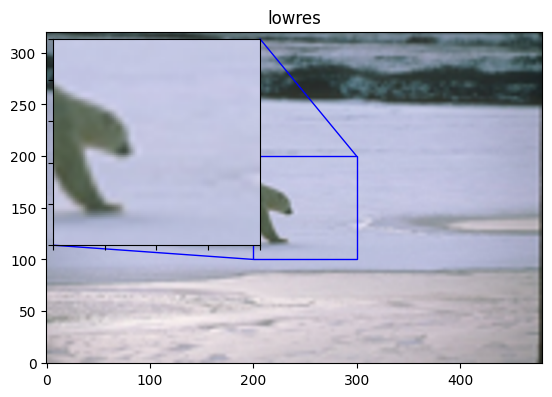

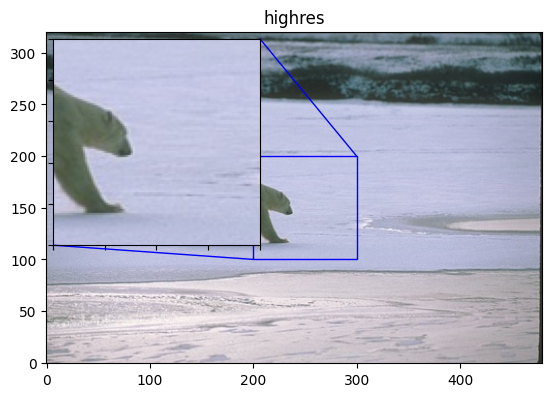

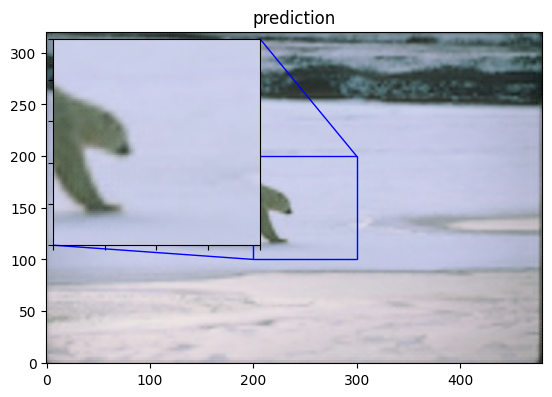

1/1 [==============================] - 0s 249ms/step
PSNR of low resolution image and high resolution image is 23.0361
PSNR of predict and high resolution is 22.0741


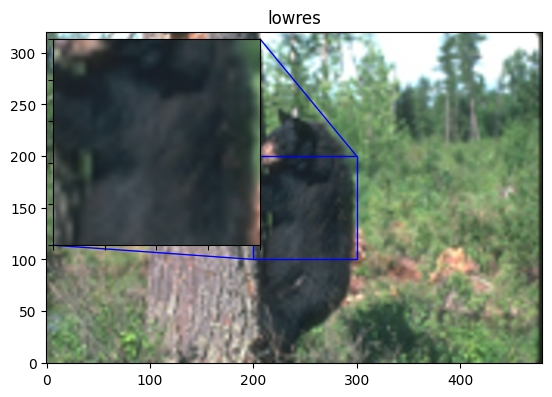

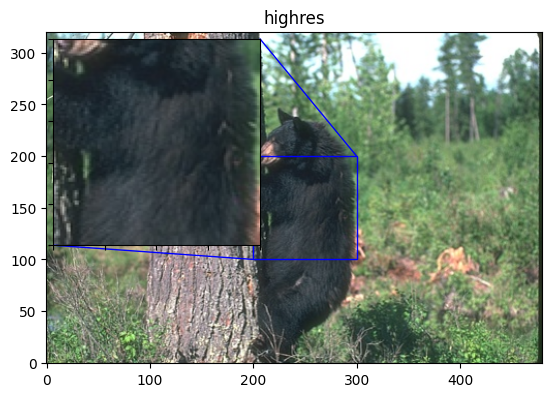

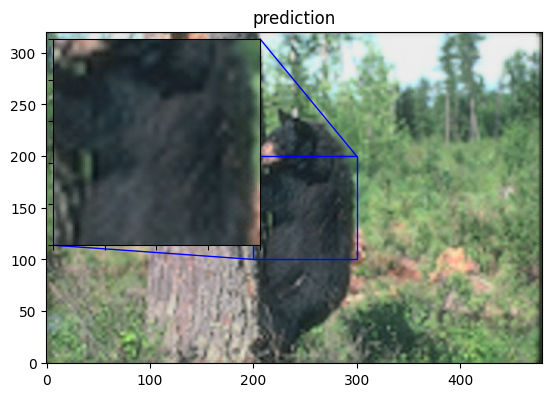

1/1 [==============================] - 0s 52ms/step
PSNR of low resolution image and high resolution image is 33.8237
PSNR of predict and high resolution is 28.6361


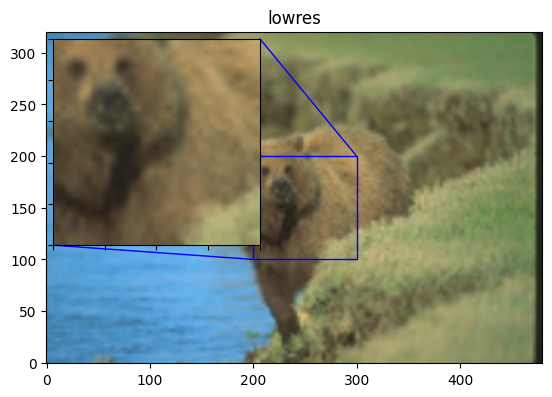

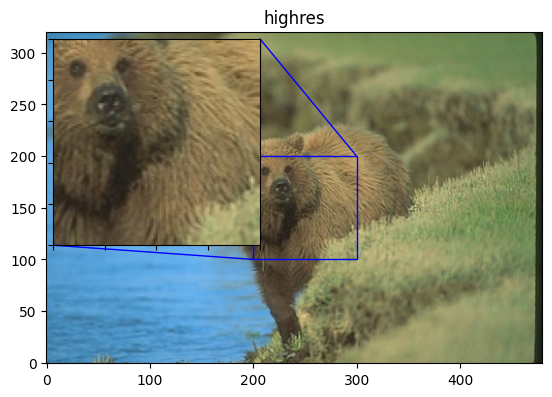

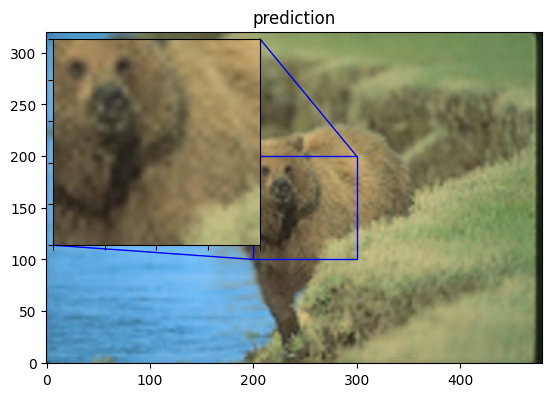

1/1 [==============================] - 0s 95ms/step
PSNR of low resolution image and high resolution image is 27.8513
PSNR of predict and high resolution is 25.6588


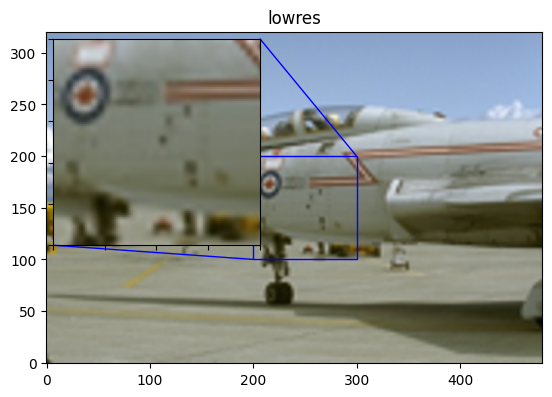

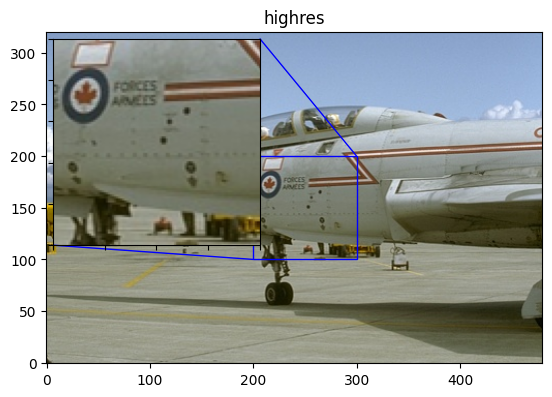

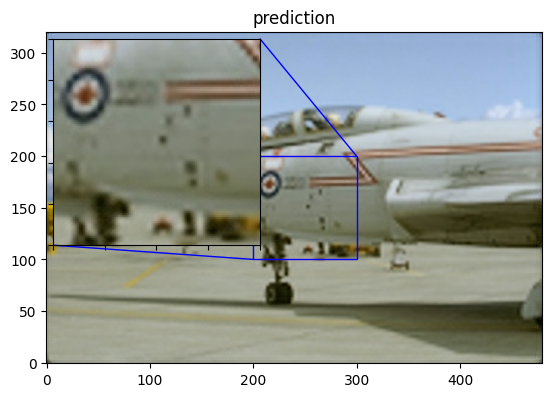

1/1 [==============================] - 0s 258ms/step
PSNR of low resolution image and high resolution image is 22.7229
PSNR of predict and high resolution is 22.2688


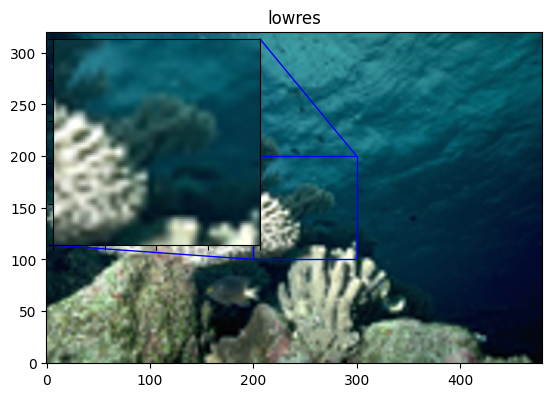

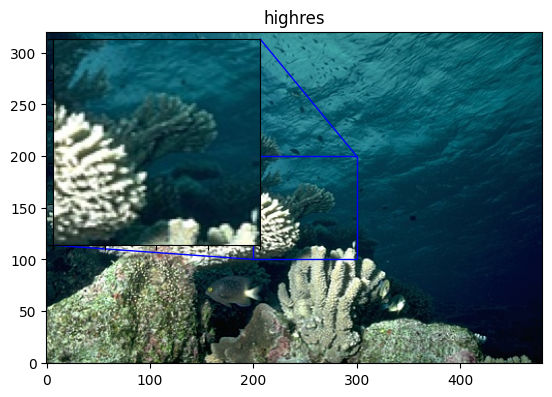

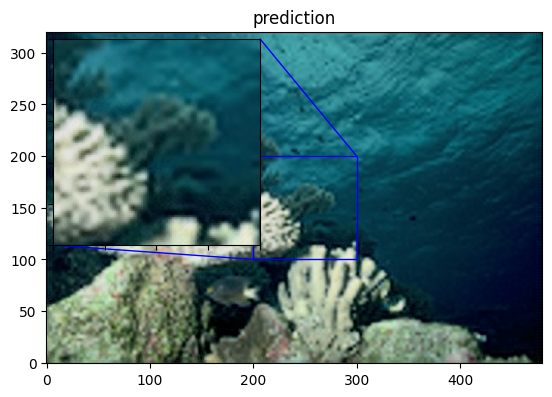

1/1 [==============================] - 1s 551ms/step
PSNR of low resolution image and high resolution image is 22.3588
PSNR of predict and high resolution is 21.8158


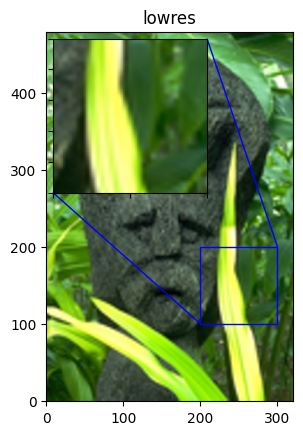

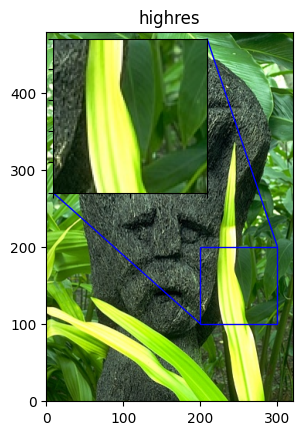

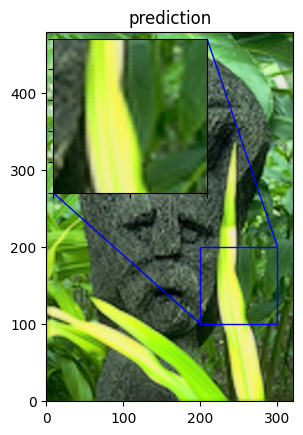

1/1 [==============================] - 0s 76ms/step
PSNR of low resolution image and high resolution image is 21.3350
PSNR of predict and high resolution is 20.9099


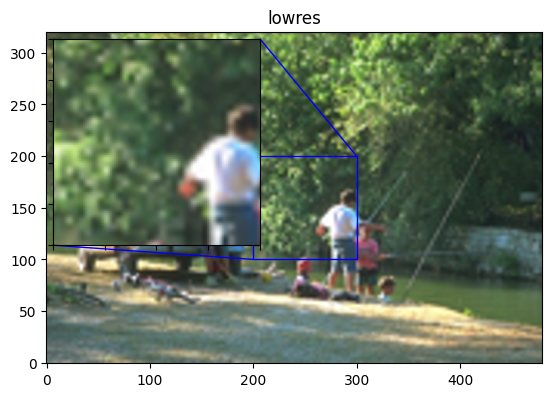

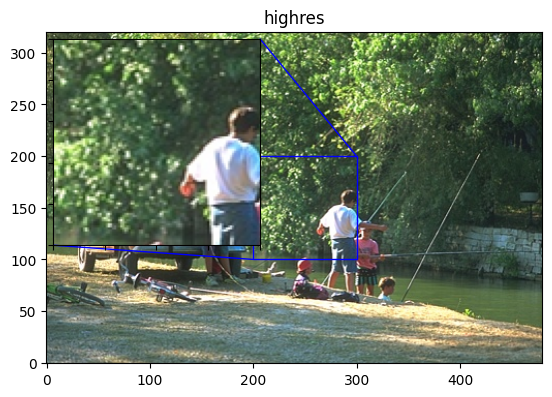

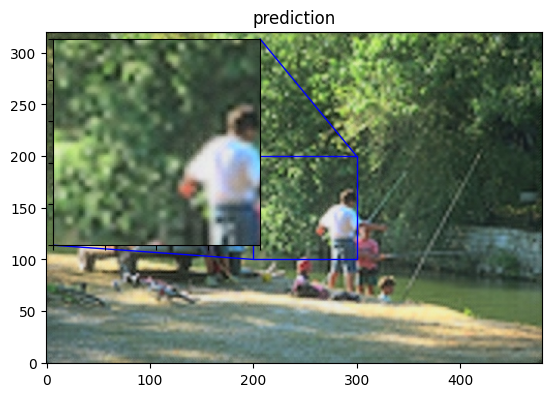

1/1 [==============================] - 0s 191ms/step
PSNR of low resolution image and high resolution image is 23.6506
PSNR of predict and high resolution is 22.6668


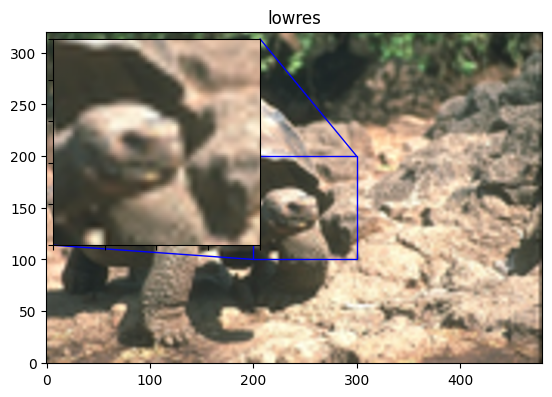

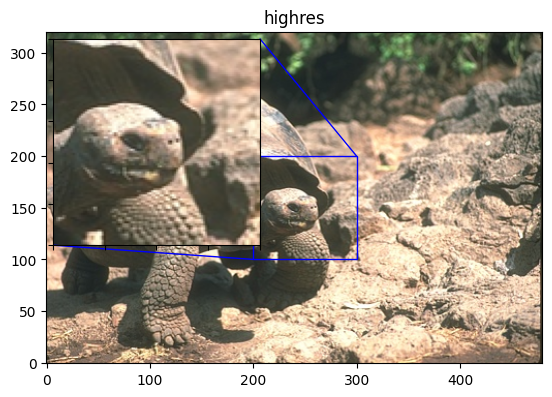

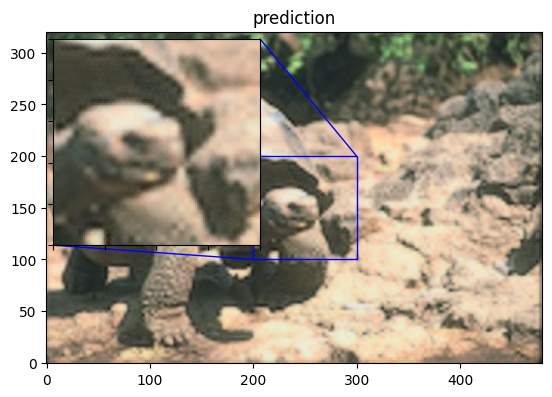

1/1 [==============================] - 0s 399ms/step
PSNR of low resolution image and high resolution image is 33.5384
PSNR of predict and high resolution is 30.2863


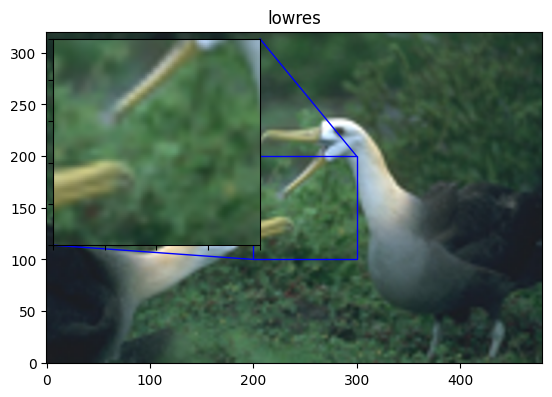

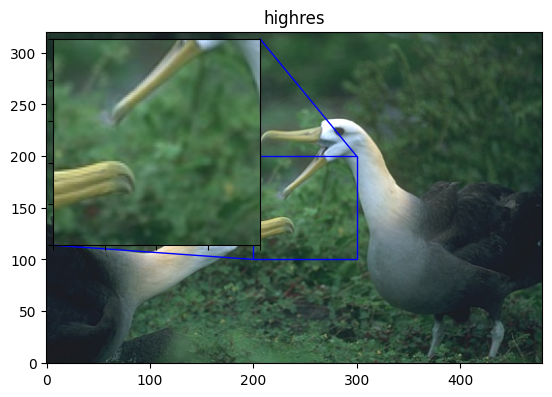

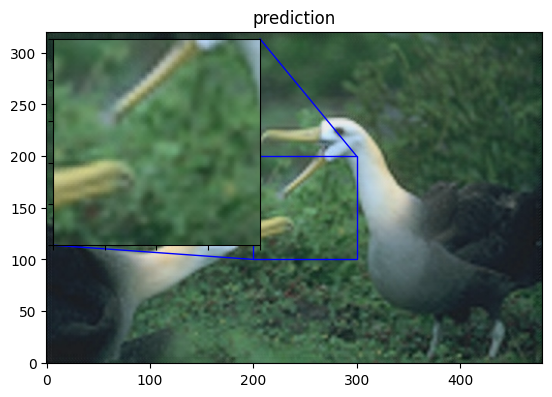

1/1 [==============================] - 0s 86ms/step
PSNR of low resolution image and high resolution image is 26.3644
PSNR of predict and high resolution is 24.3161


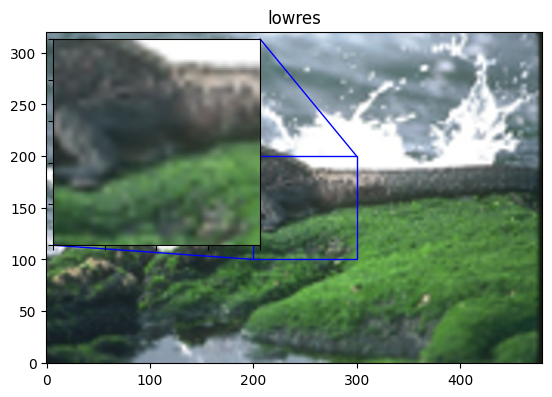

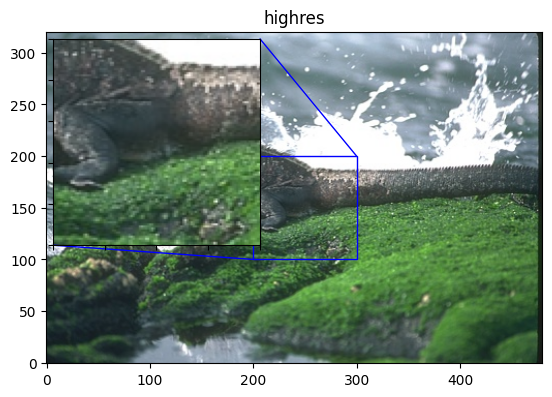

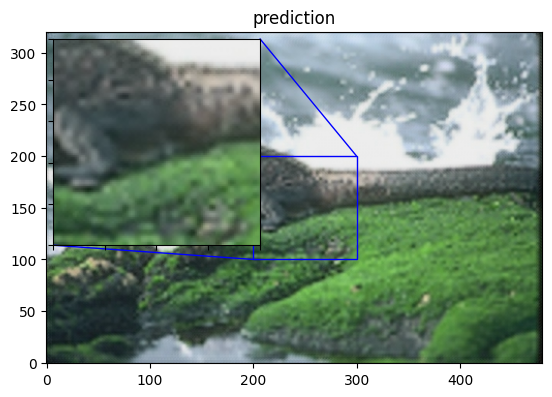

Avg. PSNR of lowres images is 26.5104
Avg. PSNR of reconstructions is 24.5741


In [17]:
import cv2
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize((img.size[0] // upscale_factor, img.size[1] // upscale_factor),PIL.Image.BICUBIC)

def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert("RGB")
    return out_img

def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig("images_out/" + str(prefix) + "-" + title + ".png")
    plt.show()

for index, test_img_path in enumerate(test_imgs[0:10]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print("PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr)
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")
    # counter+=1

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))